In [1]:
import sys, os
sys.path.insert(0, os.path.join(os.path.abspath('..'), 'src'))

In [2]:
save_folder = r'equilibrium-state-flow-calculations-parameterizing-anisotropy'
if not os.path.isdir(save_folder):
    os.makedirs(save_folder)

In [3]:
data_folder = r'data-from-cody'

In [4]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd

import FiniteDifference as fd
import LiquidCrystalHelper as lch
import biharm as bh

import time
from importlib import reload

In [5]:
reload(lch)

<module 'LiquidCrystalHelper' from 'C:\\Users\\lucas\\Documents\\Grad Work\\Summer Research 2020\\LiquidCrystalHydrodynamics\\src\\LiquidCrystalHelper.py'>

In [6]:
%matplotlib inline
dpi = 700
mpl.rcParams['figure.dpi'] = dpi

In [7]:
l = 10
n = 257

x = np.linspace(-l, l, num=n)
y = np.linspace(-l, l, num=n)
X, Y = np.meshgrid(x, y, indexing='ij')

dx = x[1] - x[0]

In [8]:
eta_filename = os.path.join(data_folder, "eta_Iso.csv")
eta = np.genfromtxt(eta_filename, delimiter=',')

mu_filename = os.path.join(data_folder, "mu_Iso.csv")
mu = np.genfromtxt(mu_filename, delimiter=',')

nu_filename = os.path.join(data_folder, "nu_Iso.csv")
nu = np.genfromtxt(nu_filename, delimiter=',')

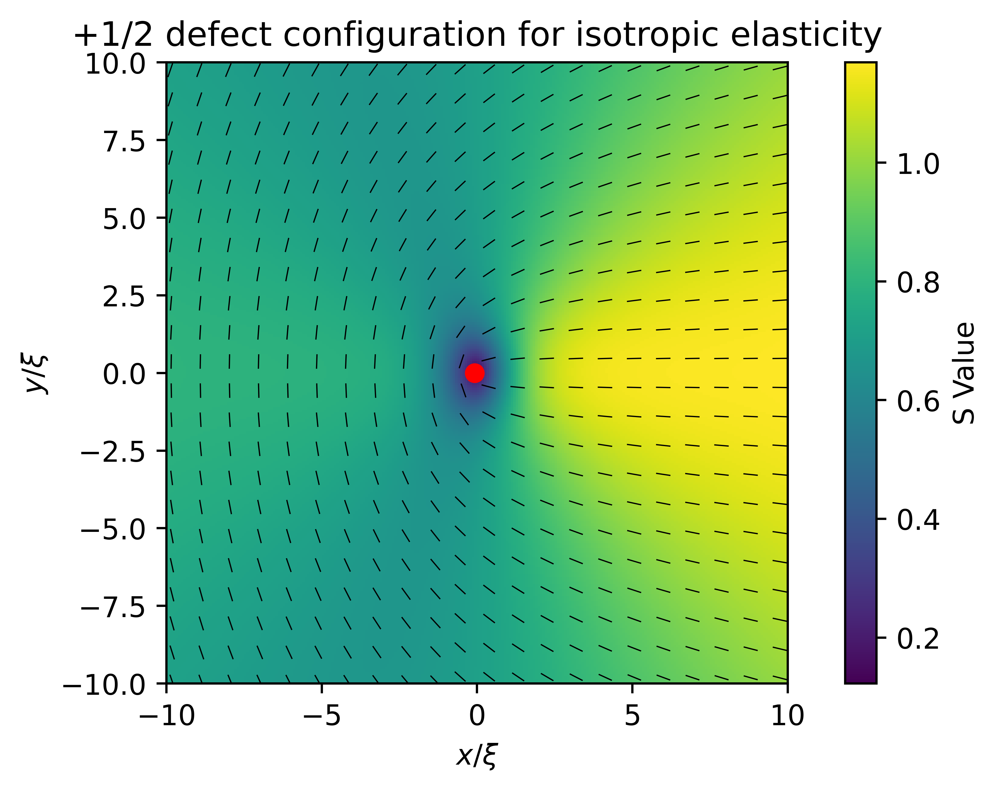

In [9]:
num_defects = 1

sparse_shape = (20, 20)
S_sparse_shape = (257, 257)
S_cutoff = 0.1

lambda_max = lch.calcQEigenvals(eta, mu, nu)
U, V = lch.calcQEigenvecs(eta, mu, nu, lambda_max, S_cutoff)

min_vals, min_x, min_y = lch.findDefects(lambda_max, X, Y, num_defects)

sparse_idx = lch.sparseIdx(eta.shape, sparse_shape)
S_sparse_idx = lch.sparseIdx(eta.shape, S_sparse_shape)

fig, ax = plt.subplots()
c = ax.pcolor(X[S_sparse_idx], Y[S_sparse_idx], (3/2)*lambda_max[S_sparse_idx])
q = ax.quiver(X[sparse_idx], Y[sparse_idx], U[sparse_idx], V[sparse_idx],
              headwidth=0, pivot='middle', headaxislength=5, scale=30, width=0.002)
ax.plot(min_x, min_y, marker='o', c='r')

fig.colorbar(c, ax=ax, label="S Value")
ax.set_title("+1/2 defect configuration for isotropic elasticity")
ax.set_xlabel(r"$x/\xi$")
ax.set_ylabel(r"$y/\xi$")
ax.set_aspect('equal', 'box')
fig.tight_layout()

config_filename = os.path.join(save_folder, r'iso-configuration.png')
fig.savefig(config_filename)

In [10]:
L = [2*l, 2*l]
shape = [n - 1, n - 1]
alpha = 0
maxiter = 500

bh_solver = bh.Biharm(L, shape, alpha, cg_maxiter=maxiter)

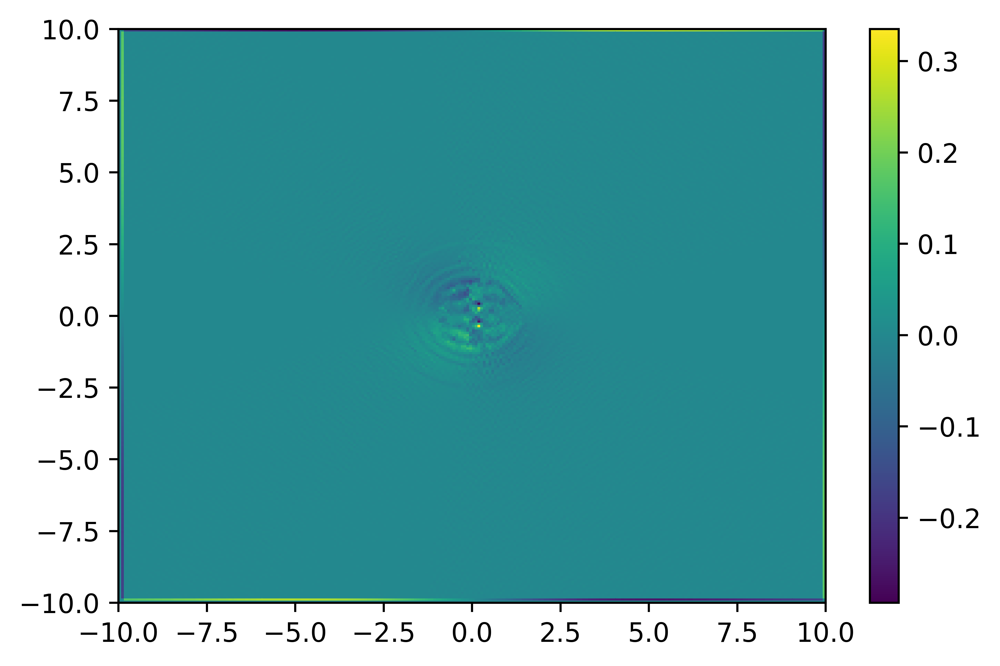

In [11]:
fig, ax = plt.subplots()

c = ax.pcolormesh(X, Y, lch.Phi_L1(eta, mu, nu, dx))
fig.colorbar(c, ax=ax)

# Want to calculate flow for different coefficient values

In [18]:
kappa_2 = 0
kappa_3 = 0

In [19]:
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

In [20]:
def plotVelocityField(psi, X, Y, field_shape, title, filename):
    
    # get grid-spacing
    dx = X[1, 0] - X[0, 0]

    # calculate velocities
    vx, vy = fd.curl(psi, dx)
    v = np.sqrt(vx**2 + vy**2)

    # normalize velocity components, except where v = 0
    mask = np.where(v != 0)
    vx_norm = np.zeros(vx.shape)
    vy_norm = np.zeros(vy.shape)
    vx_norm[mask] = vx[mask]/v[mask]
    vy_norm[mask] = vy[mask]/v[mask]

    # indices of field where arrows will go
    sparse_idx = lch.sparseIdx(vx.shape, field_shape)

    # plot velocity magnitude and direction (w/quiver)
    fig, ax = plt.subplots()
    ax.plot(min_x, min_y, marker='o', c='r')
    c = ax.pcolormesh(X, Y, v)
    fig.colorbar(c, ax=ax)
    q = ax.quiver(X[sparse_idx], Y[sparse_idx],
                  vx_norm[sparse_idx], vy_norm[sparse_idx], pivot='tail', color='w')
    
    # label everything
    ax.set_title(title)
    ax.set_xlabel(r'$x/\xi$')
    ax.set_ylabel(r'$y/\xi$')
    ax.set_aspect('equal', 'box')
    fig.tight_layout()

    filename_path = os.path.join(save_folder, filename)
    fig.savefig(filename_path)
    
    return fig, ax

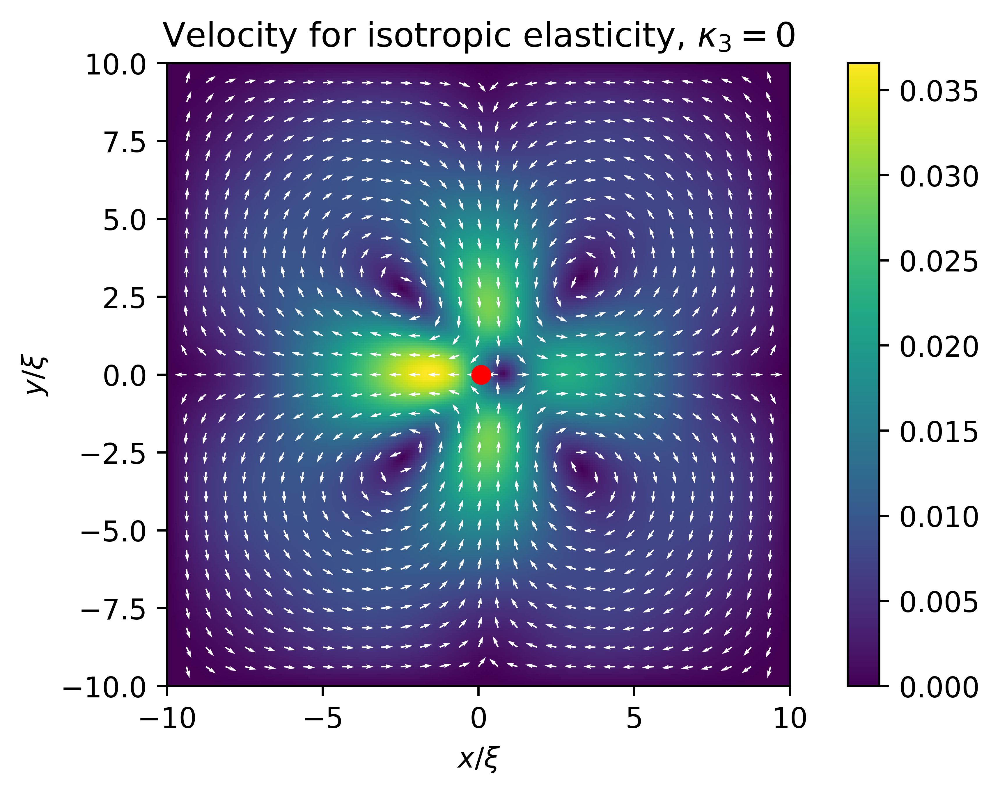

In [21]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

# Let's try for different velocity values

In [22]:
kappa_3 = 1
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

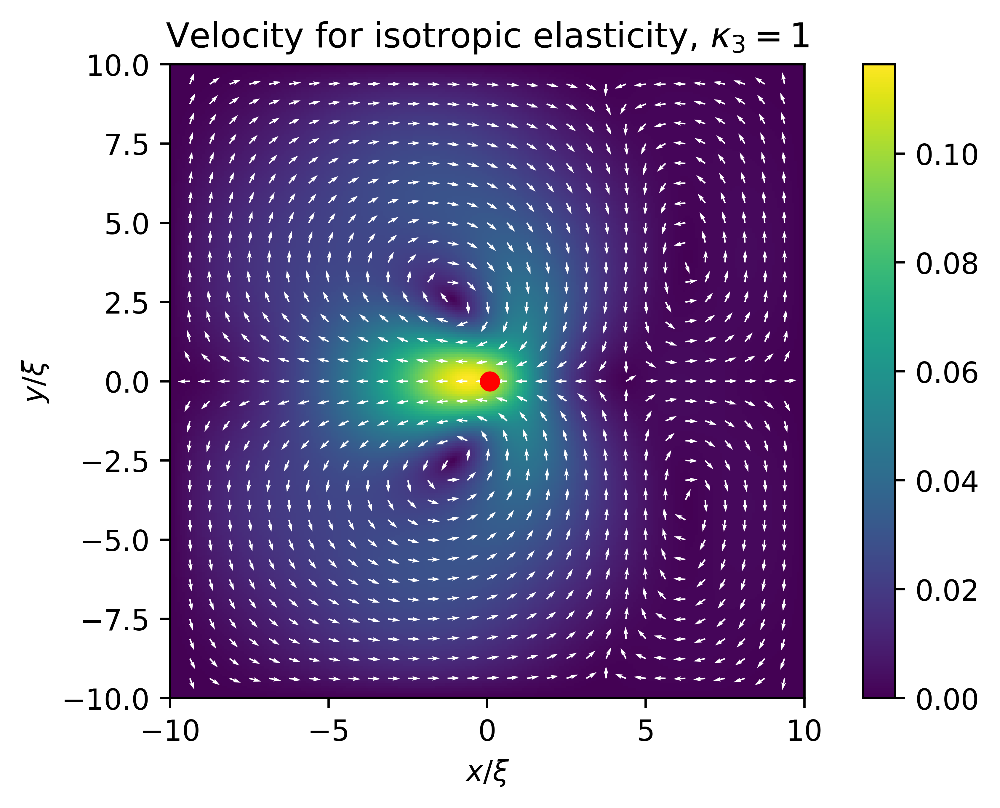

In [23]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [24]:
kappa_3 = 2
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

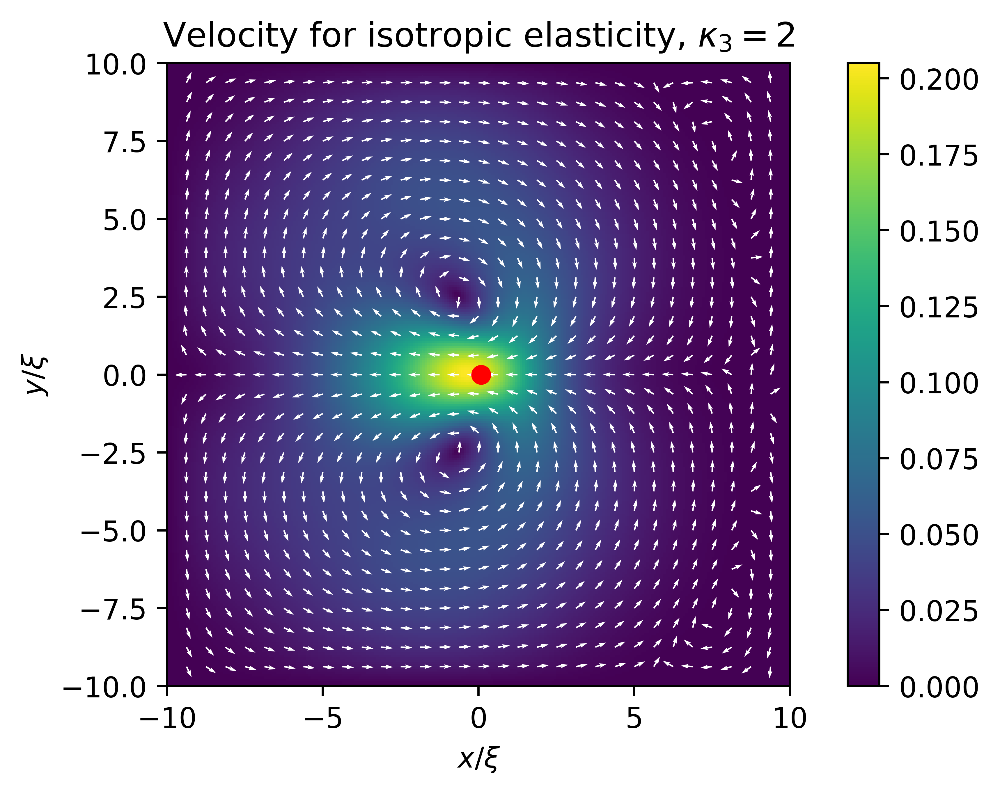

In [25]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [26]:
kappa_3 = 3
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

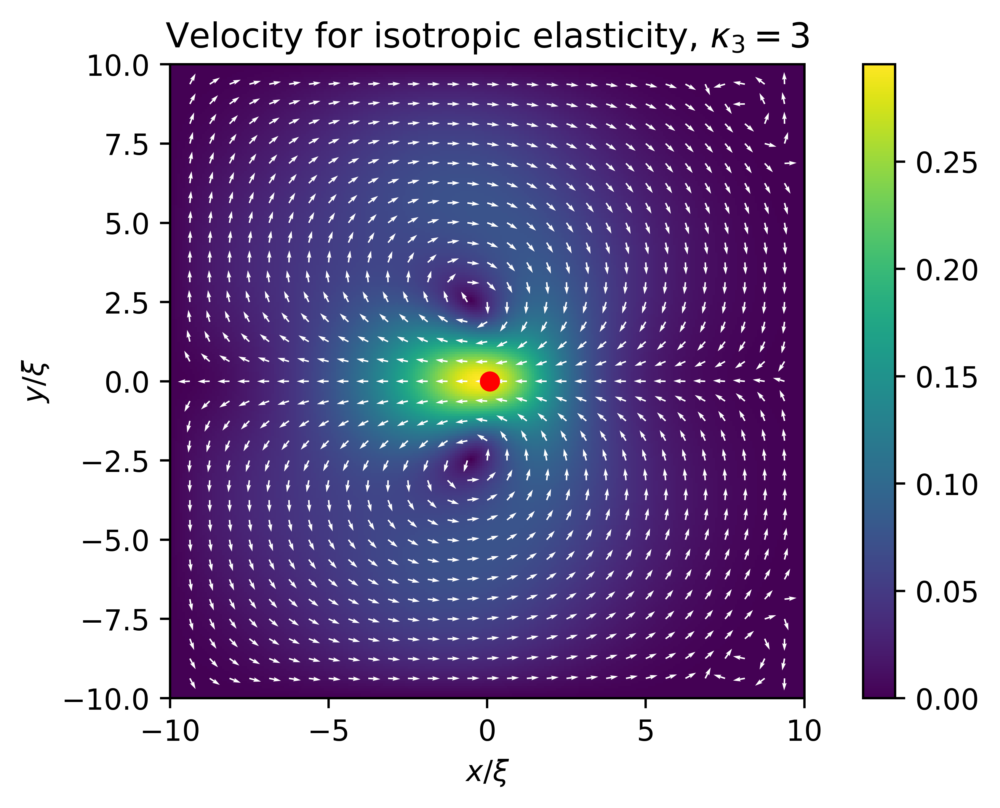

In [27]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [28]:
kappa_3 = 4
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

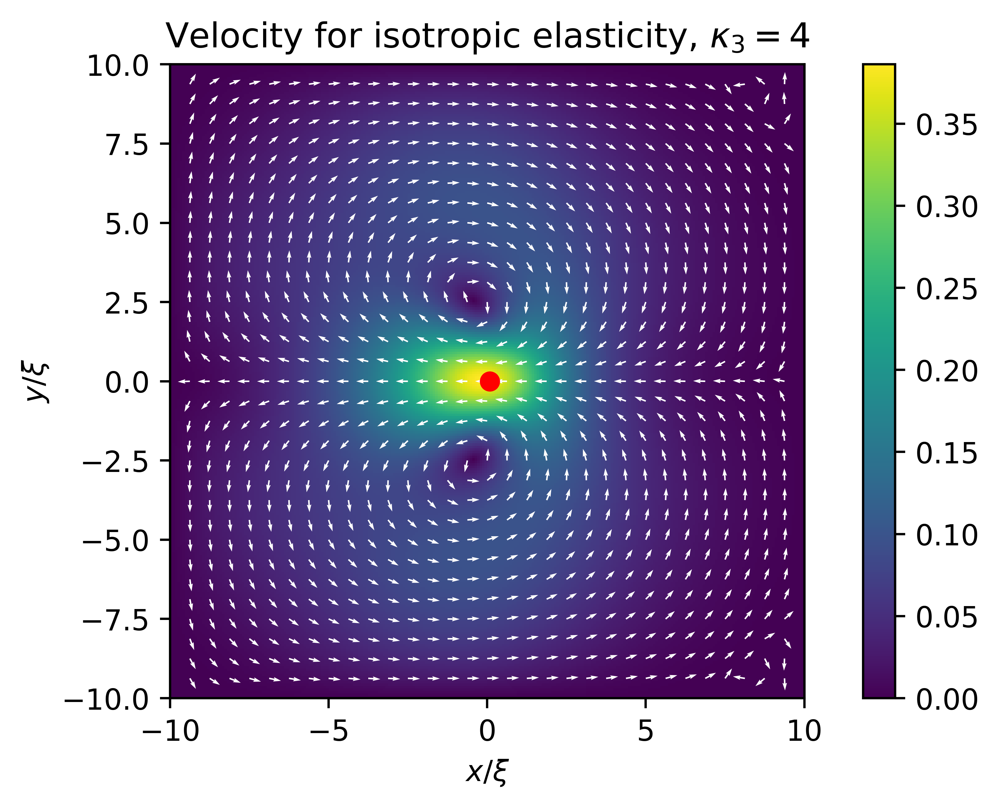

In [29]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [30]:
kappa_3 = 5
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

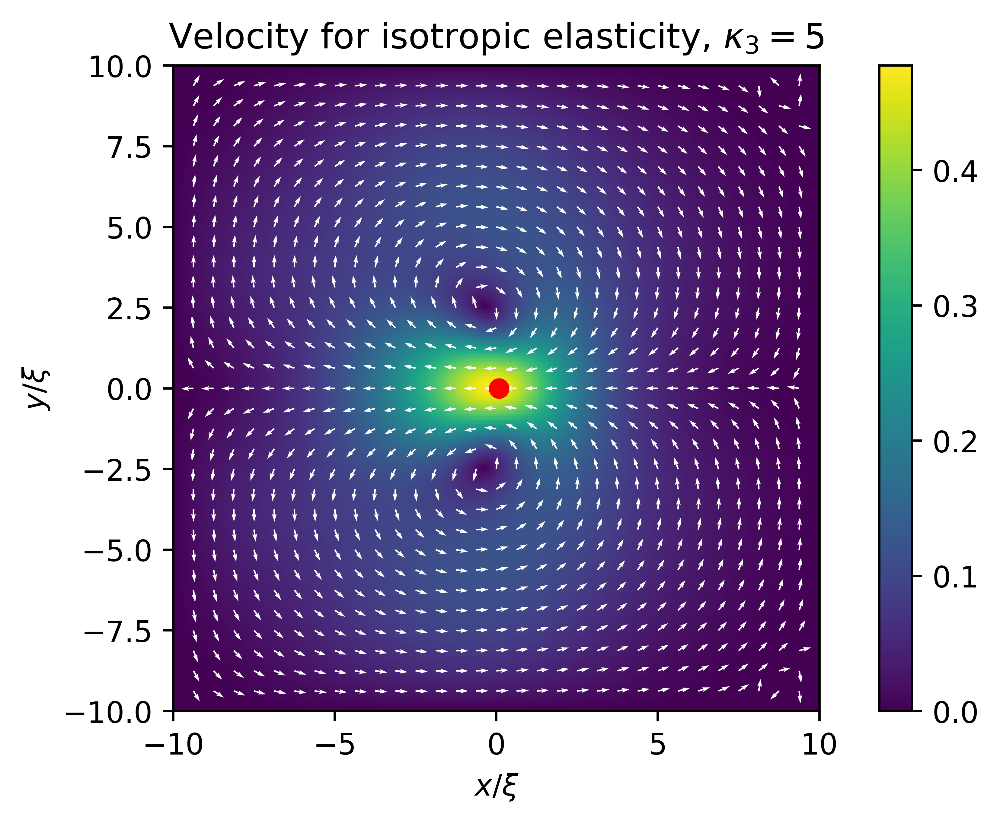

In [31]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

# Let's try for some negative values

In [32]:
kappa_3 = -0.5
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

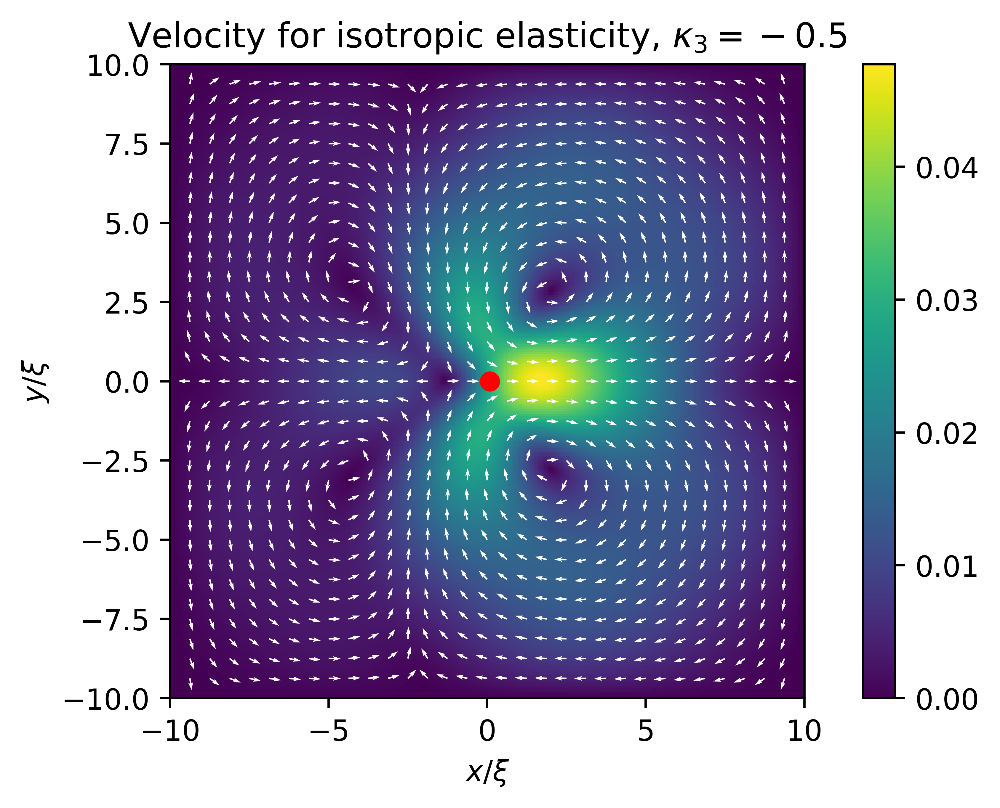

In [33]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [34]:
kappa_3 = -1
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

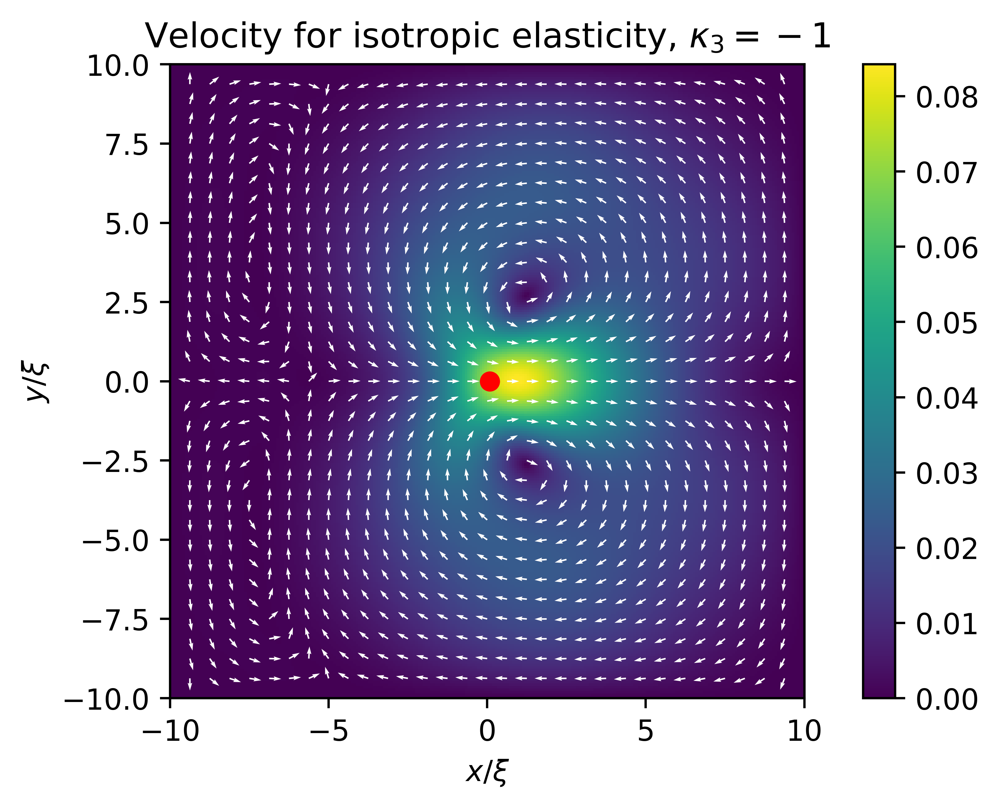

In [35]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [36]:
kappa_3 = -1.5
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

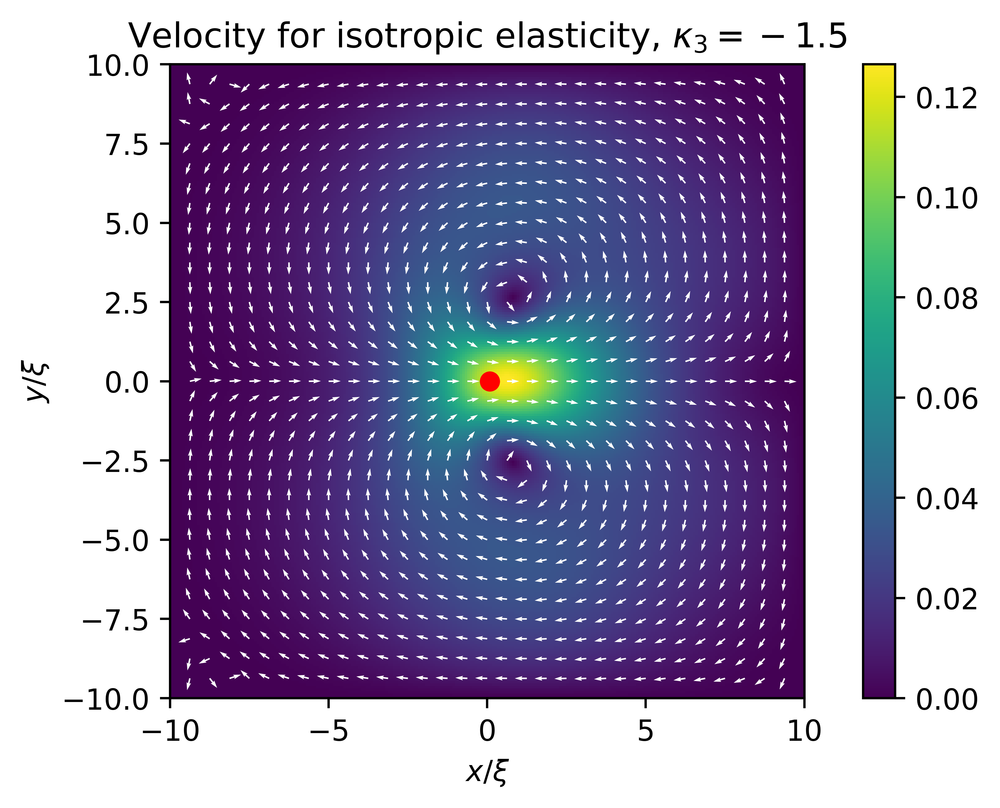

In [37]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

In [45]:
kappa_3 = -4
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

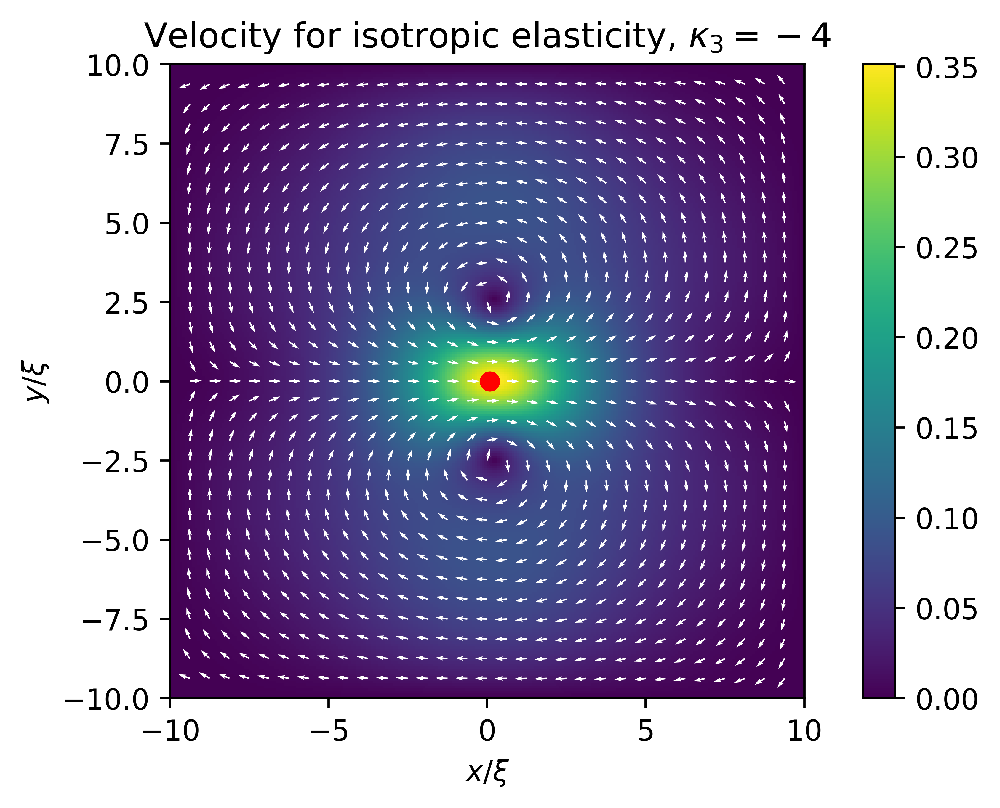

In [46]:
field_shape = (30, 30)
title = r"Velocity for isotropic elasticity, $\kappa_3 = {}$".format(kappa_3)
filename = r'v_iso_kappa3_{}.png'.format(kappa_3)

fig, ax = plotVelocityField(psi, X, Y, field_shape, title, filename)

# Let's do an animation

### Initialize the animation

In [211]:
kappa_array = np.linspace(-4, 4, num=500)
kappa_3 = kappa_array[0]
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

field_shape = (30, 30)

In [213]:
# calculate velocities
vx, vy = fd.curl(psi, dx)
v = np.sqrt(vx**2 + vy**2)

# normalize velocity components, except where v = 0
mask = np.where(v != 0)
vx_norm = np.zeros(vx.shape)
vy_norm = np.zeros(vy.shape)
vx_norm[mask] = vx[mask]/v[mask]
vy_norm[mask] = vy[mask]/v[mask]

# indices of field where arrows will go
sparse_idx = lch.sparseIdx(vx.shape, field_shape)

# Label everything
title = r"Velocity for isotropic elasticity, variable $\kappa_3$"
text_pos = (3, 8.5)
text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)

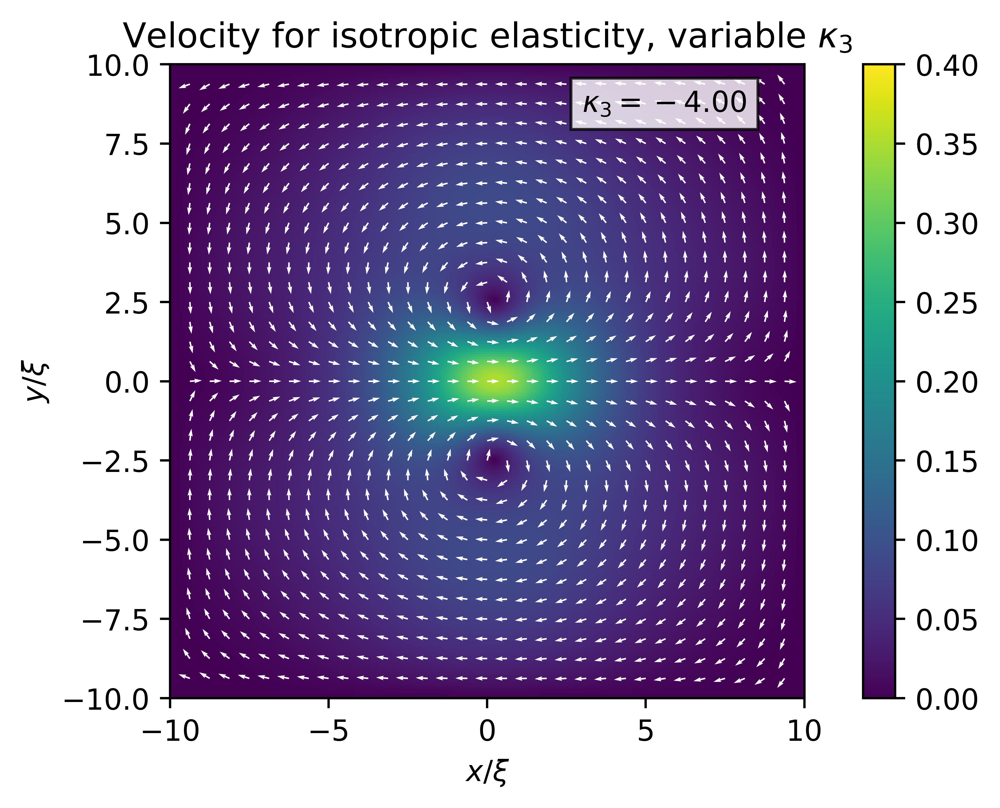

In [214]:
# plot everything
fig, ax = plt.subplots()
c = ax.pcolormesh(X, Y, v, vmin=0, vmax=0.4)
q = ax.quiver(X[sparse_idx], Y[sparse_idx],
              vx_norm[sparse_idx], vy_norm[sparse_idx], pivot='tail', color='w')
t = ax.text(text_pos[0], text_pos[1], text, bbox=dict(facecolor='white', alpha=0.8))

# label the plot
fig.colorbar(c, ax=ax)
ax.set_title(title)
ax.set_xlabel(r'$x/\xi$')
ax.set_ylabel(r'$y/\xi$')
ax.set_aspect('equal', 'box')
fig.tight_layout()

### Create function to update animation

In [215]:
def update(frame):
    
    kappa_3 = kappa_array[frame]
    new_text = text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)
    
    # Calculate flow velocities
    psi = np.zeros(eta.shape)
    source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                               + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                               + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                               )
    psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])
    
    # calculate velocities
    vx, vy = fd.curl(psi, dx)
    v = np.sqrt(vx**2 + vy**2)

    # normalize velocity components, except where v = 0
    mask = np.where(v != 0)
    vx_norm = np.zeros(vx.shape)
    vy_norm = np.zeros(vy.shape)
    vx_norm[mask] = vx[mask]/v[mask]
    vy_norm[mask] = vy[mask]/v[mask]

    # indices of field where arrows will go
    sparse_idx = lch.sparseIdx(vx.shape, field_shape)
    
    c.set_array(v[:-1, :-1].ravel())
    q.set_UVC(vx_norm[sparse_idx], vy_norm[sparse_idx])
    t.set_text(new_text)
    
    return (c, q, t)

In [217]:
frames = [i for i in range(500)]
video_length = 20000 # milliseconds
interval = int(video_length / len(frames))
filename = "isotropic-config-varying-K_3.mp4"
file_path = os.path.join(save_folder, filename)
ani = mpl.animation.FuncAnimation(fig, update, frames, blit=True, interval=interval)
ani.save(file_path, dpi=400)

# Let's do it for the $\epsilon < 0$ configuration

In [255]:
eta_filename = os.path.join(data_folder, "eta_negEps.csv")
eta = np.genfromtxt(eta_filename, delimiter=',')

mu_filename = os.path.join(data_folder, "mu_negEps.csv")
mu = np.genfromtxt(mu_filename, delimiter=',')

nu_filename = os.path.join(data_folder, "nu_negEps.csv")
nu = np.genfromtxt(nu_filename, delimiter=',')

In [256]:
kappa_array = np.linspace(-4, 4, num=500)
kappa_3 = kappa_array[0]
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

field_shape = (30, 30)

In [257]:
# calculate velocities
vx, vy = fd.curl(psi, dx)
v = np.sqrt(vx**2 + vy**2)

# normalize velocity components, except where v = 0
mask = np.where(v != 0)
vx_norm = np.zeros(vx.shape)
vy_norm = np.zeros(vy.shape)
vx_norm[mask] = vx[mask]/v[mask]
vy_norm[mask] = vy[mask]/v[mask]

# indices of field where arrows will go
sparse_idx = lch.sparseIdx(vx.shape, field_shape)

# Label everything
title = r"Velocity for $\epsilon < 0$ elasticity, variable $\kappa_3$"
text_pos = (3, 8.5)
text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)

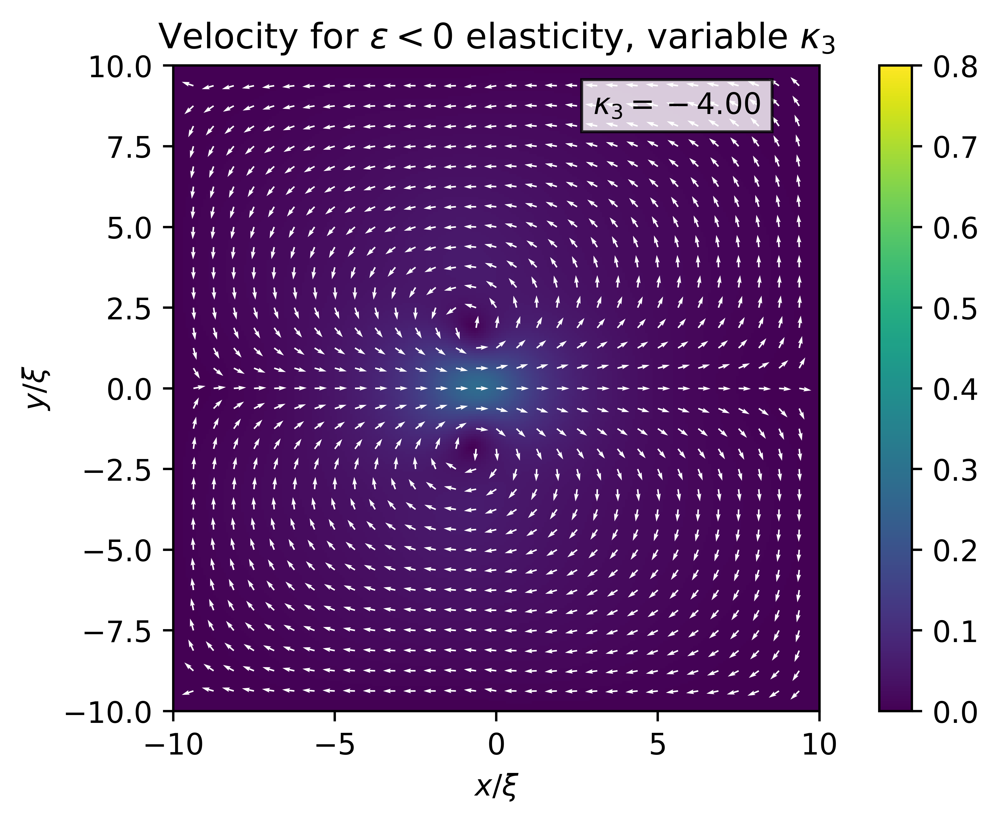

In [258]:
# plot everything
fig, ax = plt.subplots()
c = ax.pcolormesh(X, Y, v, vmin=0, vmax=0.8)
q = ax.quiver(X[sparse_idx], Y[sparse_idx],
              vx_norm[sparse_idx], vy_norm[sparse_idx], pivot='tail', color='w')
t = ax.text(text_pos[0], text_pos[1], text, bbox=dict(facecolor='white', alpha=0.8))

# label the plot
fig.colorbar(c, ax=ax)
ax.set_title(title)
ax.set_xlabel(r'$x/\xi$')
ax.set_ylabel(r'$y/\xi$')
ax.set_aspect('equal', 'box')
fig.tight_layout()

In [259]:
def update(frame):
    
    kappa_3 = kappa_array[frame]
    new_text = text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)
    
    # Calculate flow velocities
    psi = np.zeros(eta.shape)
    source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                               + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                               + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                               )
    psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])
    
    # calculate velocities
    vx, vy = fd.curl(psi, dx)
    v = np.sqrt(vx**2 + vy**2)

    # normalize velocity components, except where v = 0
    mask = np.where(v != 0)
    vx_norm = np.zeros(vx.shape)
    vy_norm = np.zeros(vy.shape)
    vx_norm[mask] = vx[mask]/v[mask]
    vy_norm[mask] = vy[mask]/v[mask]

    # indices of field where arrows will go
    sparse_idx = lch.sparseIdx(vx.shape, field_shape)
    
    c.set_array(v[:-1, :-1].ravel())
    q.set_UVC(vx_norm[sparse_idx], vy_norm[sparse_idx])
    t.set_text(new_text)
    
    return (c, q, t)

In [260]:
frames = [i for i in range(500)]
video_length = 20000 # milliseconds
interval = int(video_length / len(frames))
filename = "eps-neg-config-varying-K_3.mp4"
file_path = os.path.join(save_folder, filename)
ani = mpl.animation.FuncAnimation(fig, update, frames, blit=True, interval=interval)
ani.save(file_path, dpi=400)

# Let's do it for the $\epsilon > 0$ configuration

In [242]:
eta_filename = os.path.join(data_folder, "eta_posEps.csv")
eta = np.genfromtxt(eta_filename, delimiter=',')

mu_filename = os.path.join(data_folder, "mu_posEps.csv")
mu = np.genfromtxt(mu_filename, delimiter=',')

nu_filename = os.path.join(data_folder, "nu_posEps.csv")
nu = np.genfromtxt(nu_filename, delimiter=',')

In [243]:
kappa_array = np.linspace(-4, 6, num=500)
kappa_3 = kappa_array[0]
psi = np.zeros(eta.shape)
source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                           + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                           + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                           )
psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])

field_shape = (30, 30)

In [244]:
# calculate velocities
vx, vy = fd.curl(psi, dx)
v = np.sqrt(vx**2 + vy**2)

# normalize velocity components, except where v = 0
mask = np.where(v != 0)
vx_norm = np.zeros(vx.shape)
vy_norm = np.zeros(vy.shape)
vx_norm[mask] = vx[mask]/v[mask]
vy_norm[mask] = vy[mask]/v[mask]

# indices of field where arrows will go
sparse_idx = lch.sparseIdx(vx.shape, field_shape)

# Label everything
title = r"Velocity for $\epsilon > 0$ elasticity, variable $\kappa_3$"
text_pos = (3, 8.5)
text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)

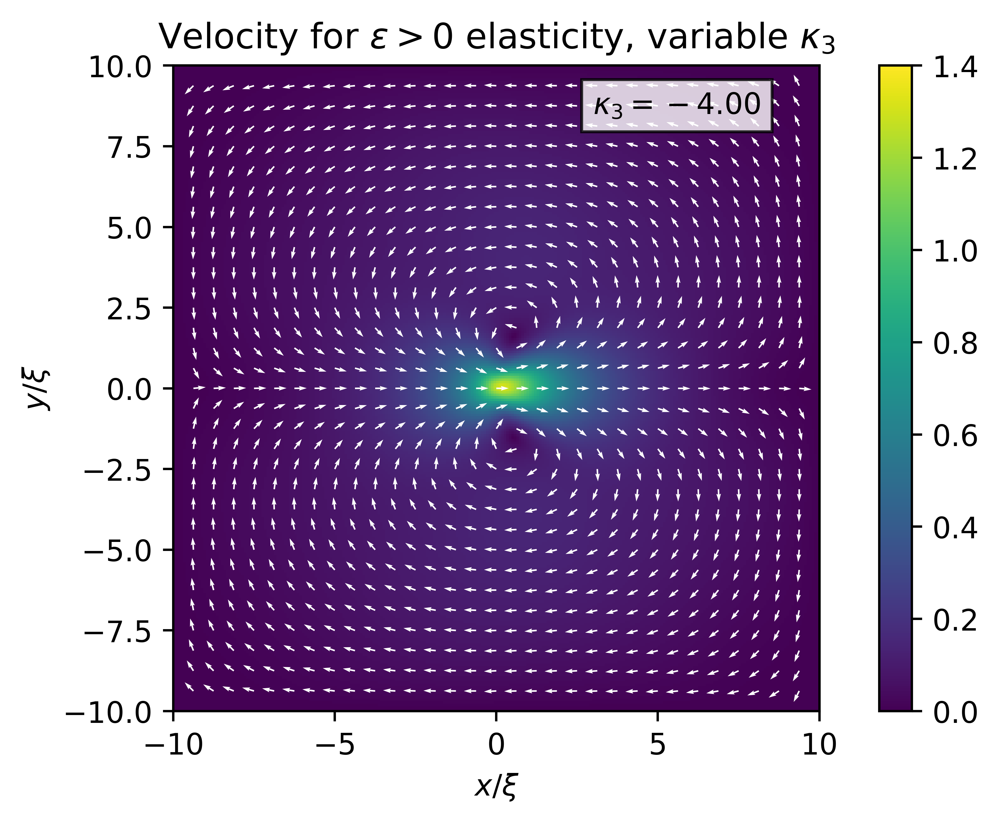

In [245]:
# plot everything
fig, ax = plt.subplots()
c = ax.pcolormesh(X, Y, v, vmin=0, vmax=1.4)
q = ax.quiver(X[sparse_idx], Y[sparse_idx],
              vx_norm[sparse_idx], vy_norm[sparse_idx], pivot='tail', color='w')
t = ax.text(text_pos[0], text_pos[1], text, bbox=dict(facecolor='white', alpha=0.8))

# label the plot
fig.colorbar(c, ax=ax)
ax.set_title(title)
ax.set_xlabel(r'$x/\xi$')
ax.set_ylabel(r'$y/\xi$')
ax.set_aspect('equal', 'box')
fig.tight_layout()

In [246]:
def update(frame):
    
    kappa_3 = kappa_array[frame]
    new_text = text = "$\\kappa_3 = {:+.2f}$".format(kappa_3)
    
    # Calculate flow velocities
    psi = np.zeros(eta.shape)
    source_term = (4 / lch.b)*(lch.Phi_L1(eta, mu, nu, dx)
                               + kappa_2*lch.Phi_L2(eta, mu, nu, dx)
                               + kappa_3*lch.Phi_L3(eta, mu, nu, dx)
                               )
    psi[1:-1, 1:-1], info, calls = bh_solver.solve(source_term[1:-1, 1:-1])
    
    # calculate velocities
    vx, vy = fd.curl(psi, dx)
    v = np.sqrt(vx**2 + vy**2)

    # normalize velocity components, except where v = 0
    mask = np.where(v != 0)
    vx_norm = np.zeros(vx.shape)
    vy_norm = np.zeros(vy.shape)
    vx_norm[mask] = vx[mask]/v[mask]
    vy_norm[mask] = vy[mask]/v[mask]

    # indices of field where arrows will go
    sparse_idx = lch.sparseIdx(vx.shape, field_shape)
    
    c.set_array(v[:-1, :-1].ravel())
    q.set_UVC(vx_norm[sparse_idx], vy_norm[sparse_idx])
    t.set_text(new_text)
    
    return (c, q, t)

In [247]:
frames = [i for i in range(500)]
video_length = 20000 # milliseconds
interval = int(video_length / len(frames))
filename = "eps-pos-config-varying-K_3.mp4"
file_path = os.path.join(save_folder, filename)
ani = mpl.animation.FuncAnimation(fig, update, frames, blit=True, interval=interval)
ani.save(file_path, dpi=400)